## 5420 Anomaly Detection, Fall 2020

#### Assignment 10: Supervised Machine Learning Techniques II

Submitted by:
Harsh Dhanuka, hd2457

## Objectives

It is important in any data science project to define the objective as specific as possible. Below let's write it from general to specific. This will direct our analysis.

* Build a model for Loan Default Prediction
* Build a model for Loan Default Prediction model by balancing the classes
* Build a model for Loan Default Prediction using the H2O package, GLM, Generalized Linear Model
* Build a model for Loan Default Prediction using the H2O package, GLM, Generalized Linear Model, using H2O Grid Search to identify optimum parameters
* Build a model for Loan Default Prediction using the H2O package, GLM, Generalized Linear Model, without Regularization
* Build a model for Loan Default Prediction using the H2O package, GLM, Generalized Linear Model, with Regularization
* Build a model for Loan Default Prediction using the H2O package, Auto ML, Automatic Machine Learning model. 

### Please click Section 4 to directly go to the Machine Learning Models


## Table of Contents

Section 1: Initial Steps

* [Section 1: Initial Steps](#Section_1)
    * [Section 1.1: Load Data](#Section_11)
    * [Section 1.2: Basic Summary Check](#Section_12)
    * [Section 1.3: Basic EDA and considerations](#Section_13)
    
    
Section 2: Data Cleaning and Preparation, Feature Engineering

* [Section 2: Data Cleaning and Preparation, Feature Engineering](#Section_2)
    * [Section 2.1: Convert the DateTime column AP005 to the relevant formats of Year, Month, Day](#Section_21)
    * [Section 2.2: Convert the misrepresented numerical categorical variables back to relevant category/object format](#Section_22)    
    * [Section 2.3: Drop all blank value and id columns](#Section_23)
    * [Section 2.4: Convert all the negative or mis-read values such as -99, etc, to 'nan' for imputation](#Section_24)
    * [Section 2.5: Fill NA's using Iterative Imputer](#Section_25)
    * [Section 2.6: Convert the loan amount column CR009 to a category variable and bin appropriately](#Section_26)    


Section 3: EDA of all variables and binning

* [Section 3: EDA and binning](#Section_3)
    * [Section 3.1: Check the Correlation using correlation plot](#Section_31)
    * [Section 3.2: Create categorical variables using qcut, and assign function to bin all continuous variables](#Section_32)
    * [Section 3.3: Distributions of the numerical data, and the % Y by X which is the mean column for all the Nategorical columns here](#Section_33)
    * [Section 3.4: Distributions of the categorical data, and the % Y by X which is the mean column for all the Categorical columns here](#Section_34)
    * [Section 3.5: EDA - Showing the distribution of X](#Section_35)
    * [Section 3.6: EDA - Showing the Distribution of Y by another Categorical Variable X](#Section_36)
    * [Section 3.7: EDA - Showing interaction of 2 or 3 variables](#Section_37)


Section 4: Models

* [Section 4: Models](#Section_4)
    * [Section 4.1: GLM Model using H2O](#Section_41)
        * [Section 4.1.1: Grid Search for optimum GLM Model parameters](#Section_411)
        * [Section 4.1.2: GLM Model without Regularization](#Section_412)
        * [Section 4.1.3: GLM Model with Regularization](#Section_413)
    * [Section 4.2: Auto-ML Model using H2O](#Section_42)

### GLM Model:

The generalized linear model (GLM) is a flexible generalization of ordinary linear regression that allows for response variables that have error distribution models other than a normal distribution. The GLM generalizes linear regression by allowing the linear model to be related to the response variable via a link function and by allowing the magnitude of the variance of each measurement to be a function of its predicted value.

Generalized Linear Models (GLM) estimate regression models for outcomes following exponential distributions. In addition to the Gaussian (i.e. normal) distribution, these include Poisson, binomial, and gamma distributions. Each serves a different purpose, and depending on distribution and link function choice, can be used either for prediction or classification.

The GLM suite includes:

- Gaussian regression
- Poisson regression
- Binomial regression (classification)
- Fractional binomial regression
- Quasibinomial regression
- Multinomial classification
- Gamma regression
- Ordinal regression
- Negative Binomial regression
- Tweedie distribution

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/data-science/glm.html



### Auto-ML, Automatic Machine Learning Model:

Automated machine learning (AutoML) is the process of automating the process of applying machine learning to real-world problems. AutoML covers the complete pipeline from the raw dataset to the deployable machine learning model. 

AutoML was proposed as an artificial intelligence-based solution to the ever-growing challenge of applying machine learning. The high degree of automation in AutoML allows non-experts to make use of machine learning models and techniques without requiring becoming an expert in the field first.

H2O’s AutoML can be used for automating the machine learning workflow, which includes automatic training and tuning of many models within a user-specified time-limit. Stacked Ensembles – one based on all previously trained models, another one on the best model of each family – will be automatically trained on collections of individual models to produce highly predictive ensemble models which, in most cases, will be the top performing models in the AutoML Leaderboard.

The H2O AutoML interface is designed to have as few parameters as possible so that all the user needs to do is point to their dataset, identify the response column and optionally specify a time constraint or limit on the number of total models trained.

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html



### H2O package
H2O is a fully open source, distributed in-memory machine learning platform with linear scalability. H2O supports the most widely used statistical & machine learning algorithms including gradient boosted machines, generalized linear models, deep learning and more. H2O also has an industry leading AutoML functionality that automatically runs through all the algorithms and their hyperparameters to produce a leaderboard of the best models. The H2O platform is used by over 18,000 organizations globally and is extremely popular in both the R & Python communities.

# 1. Initial Steps <a class="anchor" id="Section_1"></a>

In [1]:
# Import all packages
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import scipy
import time
import seaborn as sns
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, confusion_matrix
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve

import plotly
import plotly.express as px

from imblearn.datasets import make_imbalance
import pylab as pl
from collections import Counter

## 1.1. Load Data  <a class="anchor" id="Section_11"></a>

In [2]:
# Read the data
df = pd.read_csv('/Users/harshdhanuka/Desktop/Columbia Class Matter/SEM 3/5420 Anomaly Detection/Assignment 2 EDA/XYZloan_default_selected_vars.csv')
df.head(2)

,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP005,AP006,...,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005,MB007
0,0,1,1,1,31,2,1,12,2017/7/6 10:21,ios,...,13.0,13.0,0.0,0.0,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7
1,1,2,2,0,27,1,1,12,2017/4/6 12:51,h5,...,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,-99.0,NaN,WEB


## 1.2. Basic Summary Check <a class="anchor" id="Section_12"></a>

In [3]:
print("Number of rows and columns in the dataset:")
df.shape

Number of rows and columns in the dataset:


(80000, 89)

In [4]:
# Check basic statistics
print("Basic statistics of the columns are as follows:")
df.describe()

Basic statistics of the columns are as follows:


,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP007,AP008,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,...,79619.000000,79619.000000,79619.000000,79619.000000,79619.000000,79619.000000,79619.00000,79619.000000,79619.000000,77207.000000
mean,39999.500000,40000.500000,40000.500000,0.193600,31.706913,1.321813,2.014925,11.235413,3.30130,3.117200,...,6.911956,14.271694,11.773358,909.089313,810.786219,1732.693314,1539.33443,2513.226491,2229.606137,5.976272
std,23094.155105,23094.155105,23094.155105,0.395121,7.075070,0.467174,1.196806,2.212313,1.33655,1.306335,...,28.007499,38.235012,33.270641,1379.553332,1245.044602,2441.503517,2172.71384,3404.975112,3005.615048,3.641814
min,0.000000,1.000000,1.000000,0.000000,20.000000,1.000000,1.000000,3.000000,1.00000,1.000000,...,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.00000,-99.000000,-99.000000,0.000000
25%,19999.750000,20000.750000,20000.750000,0.000000,27.000000,1.000000,1.000000,12.000000,2.00000,2.000000,...,2.000000,5.000000,4.000000,84.000000,34.000000,309.000000,226.00000,539.000000,414.000000,3.000000
50%,39999.500000,40000.500000,40000.500000,0.000000,30.000000,1.000000,1.000000,12.000000,3.00000,3.000000,...,7.000000,12.000000,10.000000,475.000000,397.000000,1023.000000,870.00000,1553.000000,1324.000000,5.000000
75%,59999.250000,60000.250000,60000.250000,0.000000,35.000000,2.000000,3.000000,12.000000,5.00000,4.000000,...,14.000000,23.000000,20.000000,1209.000000,1080.000000,2287.000000,2030.00000,3296.000000,2936.000000,8.000000
max,79999.000000,80000.000000,80000.000000,1.000000,56.000000,2.000000,6.000000,12.000000,5.00000,5.000000,...,1061.000000,2792.000000,1579.000000,48585.000000,29664.000000,88364.000000,54651.00000,125352.000000,87312.000000,47.000000


## 1.3. Basic EDA and considerations <a class="anchor" id="Section_13"></a>

### a. Basic EDA of one variable `AP006`

h5         44246
ios        17159
android    17140
api         1455
Name: AP006, dtype: int64

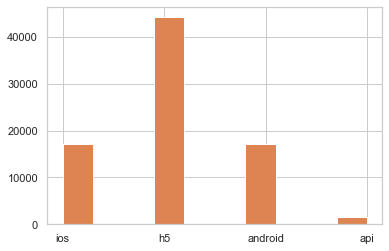

In [5]:
df['AP006'].hist()
df.AP006.hist()
df['AP006'].value_counts()

### b. EDA of the target variable `loan_default`

The number of 0's and 1's are:
0    64512
1    15488
Name: loan_default, dtype: int64


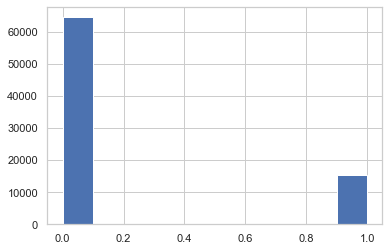

In [6]:
# Check the target variable column
print("The number of 0's and 1's are:")
print(df['loan_default'].value_counts())

df['loan_default'].hist()

### c. Check the column data types, and NA's

In [7]:
#df.info()

### d. Feature considerations from eyeballing the data types

1. The first 3 variables are ID columns, cannot be used for predictions.
`Unnamed: 0`, `Unnamed: 0.1` and `id`. 

They need to be dropped.

2. `AP005` is a Date-Time column, which cannot be used for any predictions in the model. Date-Time columns act as an ID column and all have unique values, which misrepresents the variable while making predictions. The reason is that this field almost becomes a unique identifier for each record. It is as if you employ the ‘id’ field in your decision trees. 

I will derive year, month, day, weekday, etc. from this field. In some models, we may use ‘year’ as a variable just to explain any special volatility in the past. But we will never use the raw DateTime field as a predictor.
 
3. The following columns have 0 as their value in all entries, and hence, they need to be removed from any model predictions. 

`TD025`, `TD026`, `TD027`, `TD028`, `CR012`.

4. The following columns have the same value in all entries, and hence, they need to be removed from any model predictions.

`TD029`, `TD044`, `TD048`, `TD051`, `TD054`, `TD055`, `TD061`, `TD062`.

5. Check for categorical fields from the data variable descriptions. Convert the relevant numeric fields to their respective categorical fields:

`AP002`Gender,
`AP003`Education Code,
`AP004`Loan Term,
`AP006`OS Type,
`AP007`Application City Level,
`AP008`Flag if City not Application City,
`AP009` Binary format,
`MB007` Mobile Brands/type

# 2. Data Cleaning and Preparation, Feature Engineering <a class="anchor" id="Section_2"></a>

## 2.1. Convert the DateTime column `AP005` to the relevant formats of Year, Month, Day  <a class="anchor" id="Section_21"></a>

In [8]:
df['AP005'] =  pd.to_datetime(df['AP005'])

In [9]:
# Create 4 new columns
df['Loan_app_day_name'] = df['AP005'].dt.day_name()
df['Loan_app_month'] = df['AP005'].dt.month_name()
df['Loan_app_time'] = df['AP005'].dt.time
df['Loan_app_day'] = df['AP005'].dt.day

In [10]:
# Drop old column
df = df.drop(columns = ['AP005']) 
df.head(2)

,Unnamed: 0,Unnamed: 0.1,id,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,0,1,1,1,31,2,1,12,ios,3,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,1,2,2,0,27,1,1,12,h5,5,...,-99.0,-99.0,-99.0,-99.0,NaN,WEB,Thursday,April,12:51:00,6


## 2.2. Convert the misrepresented numerical categorical variables back to relevant category/object format <a class="anchor" id="Section_22"></a>

In [11]:
df["AP002"] = df["AP002"].astype('object')

df["AP003"] = df["AP003"].astype('object')
df["AP004"] = df["AP004"].astype('object')
df["AP006"] = df["AP006"].astype('object')
df["AP007"] = df["AP007"].astype('object')
df["AP008"] = df["AP008"].astype('object')
df["AP009"] = df["AP009"].astype('object')

df["CR015"] = df["CR015"].astype('object')

df["MB007"] = df["MB007"].astype('object')

df['Loan_app_day_name'] = df['Loan_app_day_name'].astype('object')
df['Loan_app_month'] = df['Loan_app_month'].astype('object')
df['Loan_app_time'] = df['Loan_app_time'].astype('object')
df['Loan_app_day'] = df['Loan_app_day'].astype('object')

## 2.3. Drop all blank value/id columns  <a class="anchor" id="Section_23"></a>

In [12]:
df = df.drop(columns = ['Unnamed: 0', 'Unnamed: 0.1', 'id', 'TD025', 'TD026', 'TD027', 'TD028', 'CR012','TD029', 'TD044', 'TD048', 'TD051', 'TD054', 'TD055', 'TD061', 'TD062']) 
df.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,-99.0,-99.0,-99.0,-99.0,NaN,WEB,Thursday,April,12:51:00,6


## 2.4. Convert all the negative or mis-read values such as -99, etc, to 'nan' for imputation  <a class="anchor" id="Section_24"></a>

As per all the variable description, all the following columns are either counts, lengths, or days. Hence, the negative values such as -999, -99, -98, -1, etc are all mis-read NA's and need to be converted back to 'nan' format.

In [13]:
features_nan = ['AP001',
                'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005']

In [14]:
# Define a function to convert negatives to nan
def convert_to_nan(var):
    df[var][df[var] < 0] = np.nan

In [15]:
for i in features_nan:
    convert_to_nan(i)

In [16]:
# Verify that the negatives are gone
print("The minimum now stands at 0 for most of the columns, verifying the mis-represented values are gone.")
df[features_nan].describe()

The minimum now stands at 0 for most of the columns, verifying the mis-represented values are gone.


,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
count,80000.000000,80000.000000,80000.000000,80000.000000,80000.000000,80000.00000,80000.000000,80000.000000,80000.000000,80000.000000,...,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,76312.000000,77207.000000
mean,31.706913,1.986962,0.706213,3.593037,1.345700,5.40600,2.020812,6.804737,2.603662,0.718775,...,11.501677,19.180352,16.573750,952.775121,850.212037,1812.070212,1610.332071,2626.427993,2330.516878,5.976272
std,7.075070,1.807445,0.918347,2.799570,1.413362,4.02311,1.973988,5.128183,2.505840,0.882962,...,17.641851,30.743372,24.496918,1392.729146,1256.936168,2463.242747,2191.780118,3433.330482,3029.857757,3.641814
min,20.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1.000000,0.000000,2.000000,0.000000,3.00000,1.000000,3.000000,1.000000,0.000000,...,3.000000,6.000000,5.000000,123.000000,76.000000,382.000000,294.000000,649.000000,512.000000,3.000000
50%,30.000000,2.000000,0.000000,3.000000,1.000000,4.00000,2.000000,6.000000,2.000000,0.000000,...,7.000000,13.000000,11.000000,518.000000,437.000000,1098.000000,940.000000,1658.000000,1423.000000,5.000000
75%,35.000000,3.000000,1.000000,5.000000,2.000000,7.00000,3.000000,9.000000,4.000000,1.000000,...,14.000000,24.000000,21.000000,1258.000000,1123.000000,2369.000000,2107.000000,3417.000000,3037.000000,8.000000
max,56.000000,20.000000,11.000000,24.000000,21.000000,46.00000,35.000000,52.000000,43.000000,7.000000,...,1061.000000,2792.000000,1579.000000,48585.000000,29664.000000,88364.000000,54651.000000,125352.000000,87312.000000,47.000000


## 2.5. Fill the NA's using Iterative Imputer <a class="anchor" id="Section_25"></a>

Multivariate imputer that estimates each feature from all the others. A strategy for imputing missing values by modeling each feature with missing values as a function of other features in a round-robin fashion.

#### Instead of using the traditional simple mean, median or mode method of imputation, I will be using the smart method of Iterative Imputation from sklearn package.

The documentation is here: https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html

In [17]:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer

#### Make a subset of the original df with only the numeric/float64  variables which have the NA's

In [18]:
df_2 = df[features_nan]

In [19]:
# Verify

df_2.head(3)

,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
0,31,1,1,4,1,5,1,14,2,2,...,8.0,13.0,13.0,0.0,0.0,1449.0,1449.0,2249.0,2249.0,7.0
1,27,2,0,3,1,3,1,3,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,33,2,1,4,1,5,1,9,1,2,...,0.0,3.0,2.0,33.0,0.0,33.0,0.0,143.0,110.0,8.0


#### 'MEDIAN' imputation through iterative imputer

In [20]:
imp = IterativeImputer(missing_values=np.nan, sample_posterior=False, 
                                 max_iter=10, tol=0.001, 
                                 n_nearest_features=None, initial_strategy='median')
imp.fit(df_2)

IterativeImputer(initial_strategy='median')

In [21]:
imputed_data_median = pd.DataFrame(data=imp.transform(df_2), 
                             columns=['AP001',
                'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005'],
                             dtype='int')

In [22]:
imputed_data_median.head(3)

,AP001,TD001,TD002,TD005,TD006,TD009,TD010,TD013,TD014,TD015,...,CD160,CD162,CD164,CD166,CD167,CD169,CD170,CD172,CD173,MB005
0,31,1,1,4,1,5,1,14,2,2,...,8,13,13,0,0,1449,1449,2249,2249,7
1,27,2,0,3,1,3,1,3,2,0,...,7,13,10,531,465,1086,939,1651,1425,5
2,33,2,1,4,1,5,1,9,1,2,...,0,3,2,33,0,33,0,143,110,8


## 2.6. Convert the loan amount column `CR009` to a category variable and bin appropriately <a class="anchor" id="Section_26"></a>

In [23]:
df['CR009'] = pd.cut(x=df['CR009'], bins=[-1, 100000, 200000, 300000, 400000, 500000, 600000, 700000, 800000, 900000, 1000000, 1500000])
df = df.astype({'CR009':'object'})

In [24]:
df.CR009.value_counts()

(-1, 100000]          74142
(100000, 200000]       4125
(200000, 300000]        975
(300000, 400000]        353
(400000, 500000]        166
(500000, 600000]         95
(600000, 700000]         48
(700000, 800000]         32
(1000000, 1500000]       31
(800000, 900000]         19
(900000, 1000000]        14
Name: CR009, dtype: int64

# 3. EDA of variables and binning  <a class="anchor" id="Section_3"></a>

## 3.1. Check the Correlation using correlation plot <a class="anchor" id="Section_31"></a>

I will check this for the variables which are not direct counts or lengths or days.
#### The variables I use are the ones which are marked at `Credit Center` data.

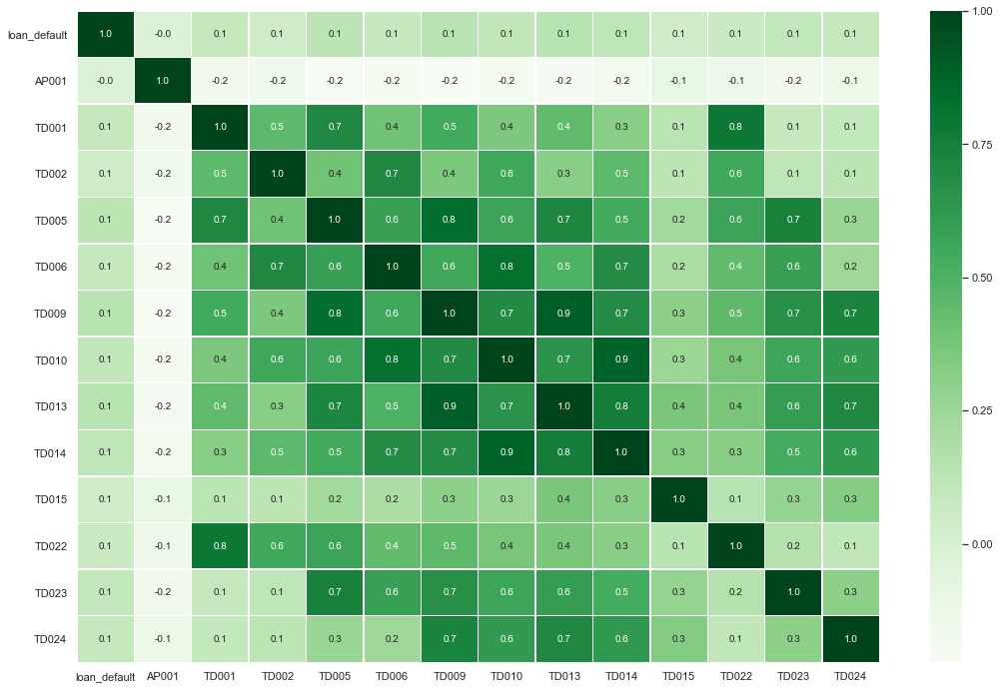

In [25]:
corr = df[['loan_default', 'AP001', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010', 'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024']].corr()
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(corr, annot=True, cmap='Greens', linewidths=.4, fmt= '.1f',ax=ax)
plt.show()

In [26]:
# Remove 1 feeature from a pair which has over 0.7 ratio
# However, H2O deals with this problem smartly, I will not remove the variables

corr_var_drop1 = ['TD005', 'TD022', 'TD006', 'TD009', 'TD013', 'TD023', 'TD010', 'TD014']

#### Check the correlations for the counts, lengths, and days columns
I will be using the other variables as they are all `Call detail` data. 

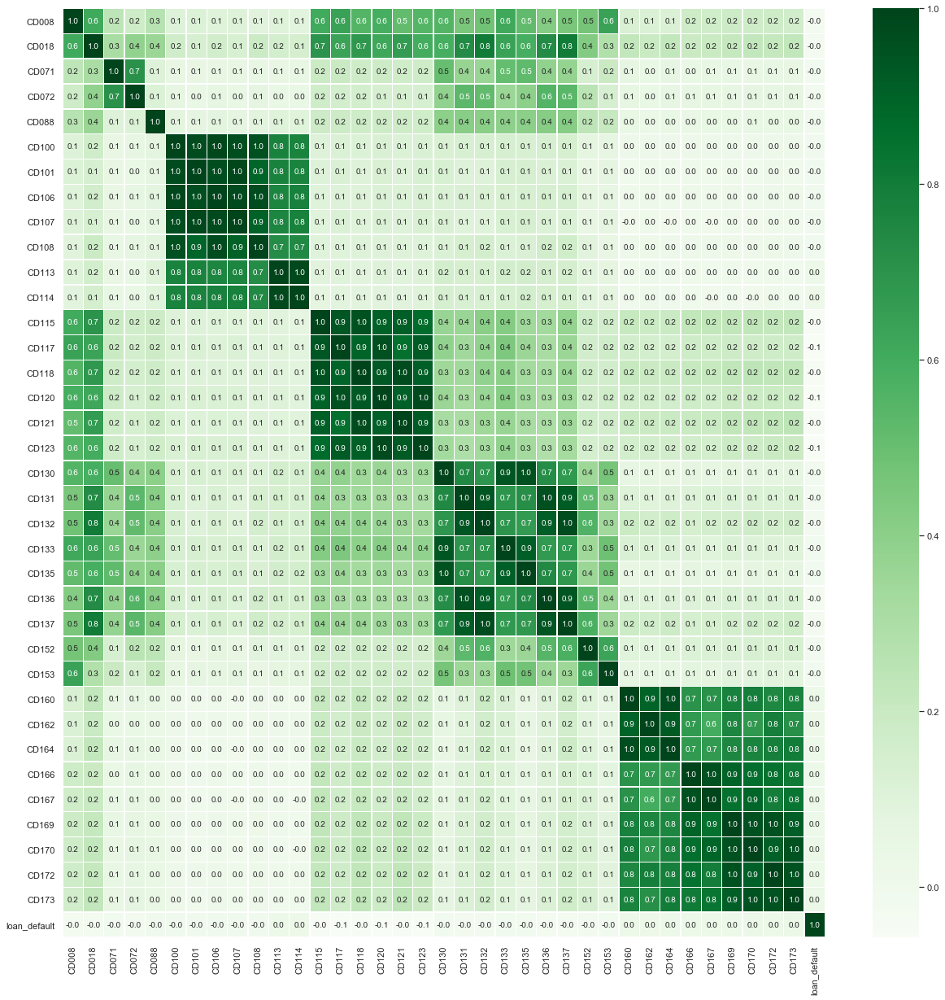

In [27]:
filter_col = [col for col in df if col.startswith('CD')]
filter_col.append('loan_default')
corr = df[filter_col].corr()
f,ax = plt.subplots(figsize=(21,21))
sns.heatmap(corr, annot=True, cmap='Greens', linewidths=.4, fmt= '.1f',ax=ax)
plt.show()

In [28]:
# Remove 1 feature from a pair which has over 0.7 ratio
# However, H2O deals with this problem smartly, I will not remove the variables

corr_var_drop2 = ['CD173', 'CD172', 'CD170', 'CD169', 'CD167', 'CD166', 'CD164', 'CD162',
                 'CD137', 'CD136', 'CD135', 'CD133', 'CD132', 'CD131', 'CD117', 'CD118',
                 'CD120', 'CD121', 'CD123', 'CD114', 'CD113', 'CD108', 'CD107', 'CD106',
                 'CD101', 'CD072']

## 3.2. Create categorical variables using qcut, and assign function to bin all continuous variables <a class="anchor" id="Section_32"></a>
### These are for the raw data, not the NA imputed one.

* You may need to split a continuous variable into a categorial variable
* Notice how the NoData category is added for "NA".

In [29]:
df_bin = df.copy(deep = True)
df_bin.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449.0,1449.0,2249.0,2249.0,7.0,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,NaN,NaN,NaN,NaN,NaN,WEB,Thursday,April,12:51:00,6


In [30]:
# Write a function and loop through 
def binning(var):
    df_bin[var + '_bin'] = pd.qcut(df_bin[var],15,duplicates='drop').values.add_categories("NoData")
    df_bin[var + '_bin'] = df_bin[var + '_bin'].fillna("NoData").astype(str)
    df_bin[var + '_bin'].value_counts(dropna=False)

In [31]:
features = ['AP001', # 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       # 'AP008', 'AP009',
       'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       #'CR009', 'CR015', 
       'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005'
       # 'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       # 'Loan_app_day'
           ]

In [32]:
for i in features:
    binning(i)

In [33]:
# View the bins of some variables 

print(df_bin['TD001_bin'].value_counts(dropna=False))
print(df_bin['TD022_bin'].value_counts(dropna=False))

(-0.001, 1.0]    33040
(1.0, 2.0]       22199
(2.0, 3.0]       12186
(3.0, 4.0]        6152
(5.0, 20.0]       3510
(4.0, 5.0]        2913
Name: TD001_bin, dtype: int64
(9.999, 15.0]    36564
NoData           19598
(15.0, 20.0]      9462
(25.0, 30.0]      8420
(20.0, 25.0]      5956
Name: TD022_bin, dtype: int64


## 3.3. Distributions of the numerical data, and the `% Y by X` which is the `mean` column for all the numerical columns here <a class="anchor" id="Section_33"></a>
#### This will help identify if mean or median is a better imputation for NA's and also help bin better manually.
#### Also, this will help in feature selection moving forward.

The 'mean' column represents the '% Y by X'.

In [34]:
def plot_X_and_Y(var):
    
    z = df_bin.groupby(var + '_bin')['loan_default'].agg(['count','mean']).reset_index() 
    z['count_pcnt'] = z['count']/z['count'].sum()
    x = z[var + '_bin']
    y_mean = z['mean']
    count_pcnt = z['count_pcnt']
    ind = np.arange(0, len(x))
    width = .5

    fig = plt.figure(figsize=(16,4))
    plt.subplot(121)
    plt.bar(ind, count_pcnt, width, color='r')
    #plt.ylabel('X')
    plt.title(var + ' Distribution')
    plt.xticks(ind,x.tolist(), rotation=45)

    plt.subplot(122)
    plt.bar(ind, y_mean, width, color='b')
    #plt.ylabel('Y by X')
    plt.xticks(ind,x.tolist(), rotation=45)
    plt.tight_layout()
    plt.title('Response mean by ' + var)
    plt.show()
    
#for i in features:
#    plot_X_and_Y(i)  
    

## 3.4. Distributions of the categorical data, and the `% Y by X` which is the `mean` column for all the Categorical columns here <a class="anchor" id="Section_34"></a>
#### This will help identify if mean or median is a better imputation for NA's and also help bin better manually.
#### Also, this will help in feature selection moving forward.

The 'mean' column represents the '% Y by X'.

In [35]:
features_2 = ['AP002', 'AP003', 'AP004', 'AP006', 'AP007', 'AP008', 'AP009',
       'CR009','CR015', 'MB007', 'Loan_app_day_name', 'Loan_app_month',
       'Loan_app_day'
           ]

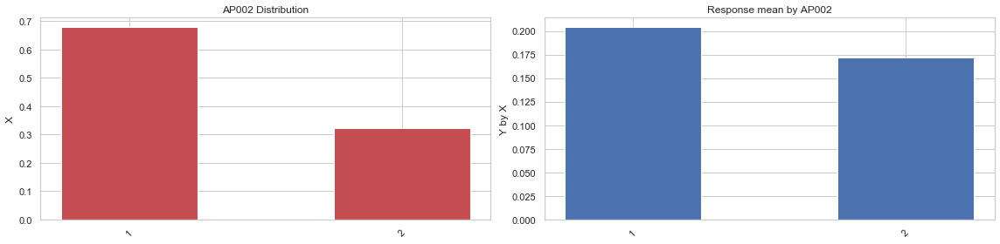

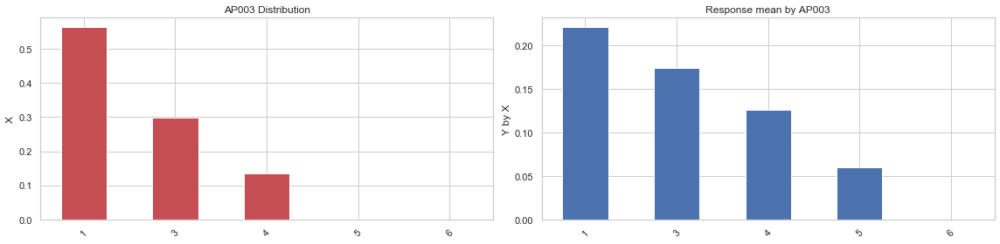

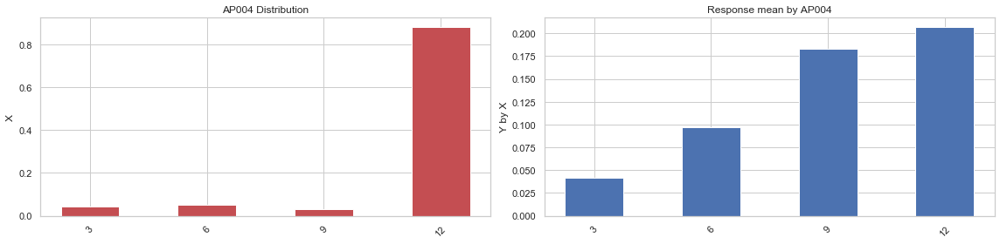

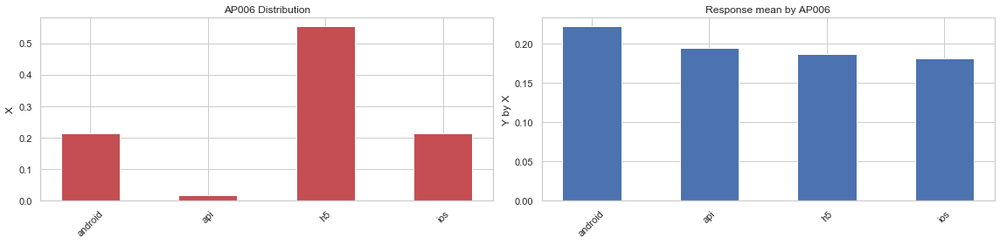

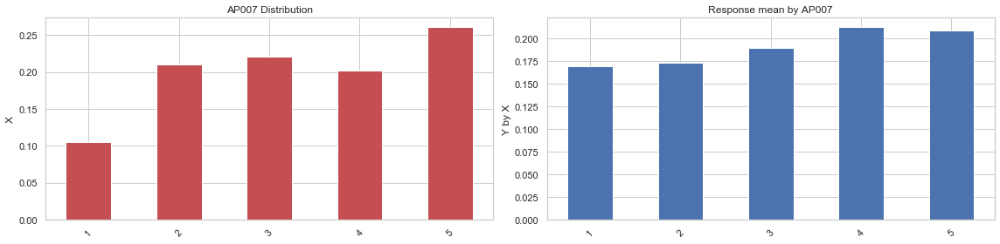

...

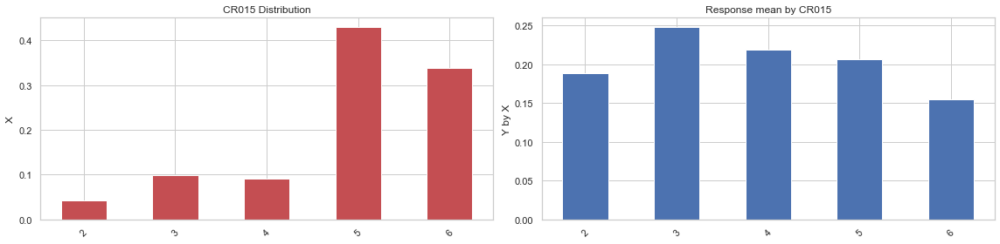

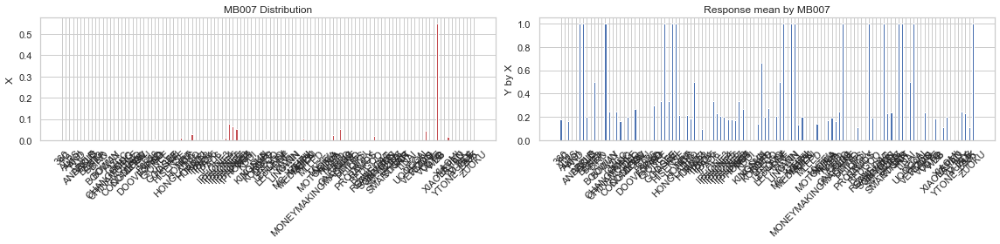

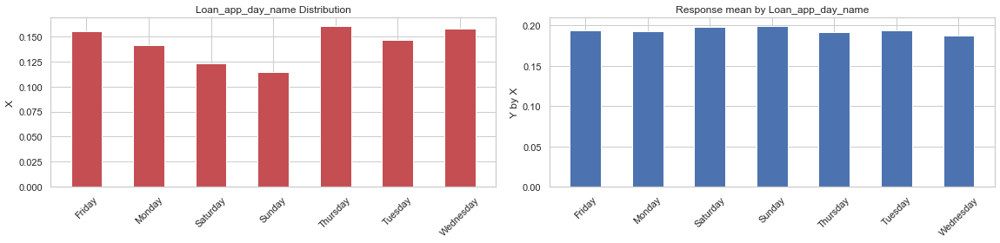

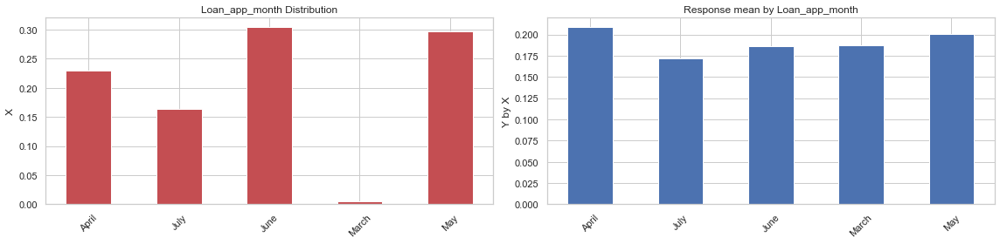

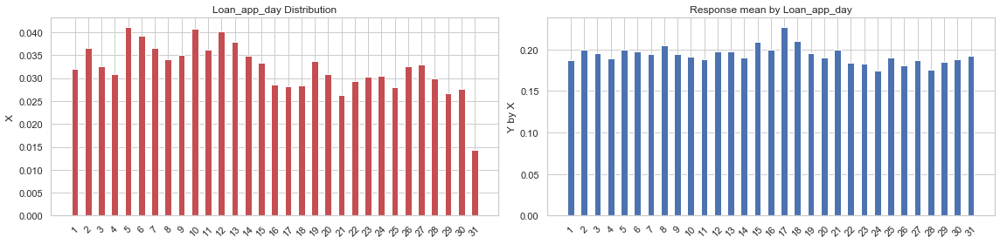

In [36]:
def plot_X_and_Y_cat(var):
    
    z = df_bin.groupby(var)['loan_default'].agg(['count','mean']).reset_index() 
    z['count_pcnt'] = z['count']/z['count'].sum()
    x = z[var]
    y_mean = z['mean']
    count_pcnt = z['count_pcnt']
    ind = np.arange(0, len(x))
    width = .5

    fig = plt.figure(figsize=(16,4))
    plt.subplot(121)
    plt.bar(ind, count_pcnt, width, color='r')
    plt.ylabel('X')
    plt.title(var + ' Distribution')
    plt.xticks(ind,x.tolist(), rotation=45)

    plt.subplot(122)
    plt.bar(ind, y_mean, width, color='b')
    plt.ylabel('Y by X')
    plt.xticks(ind,x.tolist(), rotation=45)
    plt.tight_layout()
    plt.title('Response mean by ' + var)
    plt.show()


for i in features_2:
    plot_X_and_Y_cat(i)  

### Obervations:

From the above graphs, the following variables seem to be not important, as they do not have a pattern or a trend, or a  curve on the '% Y by x' graph: 
1. `Loan_app_day_name`

### Other EDA

## 3.5. Showing the Distribution of X <a class="anchor" id="Section_35"></a>

In [37]:
df_count = df['AP006'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP006 - OS Type','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP006 - OS Type', y = 'Count', color = 'AP006 - OS Type',
             width=600, height=400,
            title = "Distribution of OS type")
fig.show()

  AP006 - OS Type  Count
0              h5  44246
1             ios  17159
2         android  17140
3             api   1455


In [38]:
df_count = df['AP002'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP002 - Gender','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP002 - Gender', y = 'Count', color = 'AP002 - Gender',
             width=600, height=400,
            title = "Distribution of Gender")
fig.show()

   AP002 - Gender  Count
0               1  54255
1               2  25745


In [39]:
df_count = df['AP003'].value_counts()
df_count = pd.DataFrame(df_count).reset_index()
df_count.columns = ['AP003 - Education','Count']
print(df_count.head())

fig = px.bar(df_count, x = 'AP003 - Education', y = 'Count', color = 'AP003 - Education',
             width=600, height=400,
            title = "Distribution of Education")
fig.show()

   AP003 - Education  Count
0                  1  45079
1                  3  23829
2                  4  10846
3                  5    232
4                  6     14


In [40]:
fig = px.box(df, x="TD001",width=1000, height=500,
            title = "Distribution of TD001 - TD_CNT_QUERY_LAST_7Day_P2P")
fig.show()

In [41]:
fig = px.box(df, x="MB005",width=1000, height=500,
            title = "Distribution of MB005")
fig.show()

## 3.6. Showing the Distribution of Y by another Categorical Variable X <a class="anchor" id="Section_36"></a>

In [42]:
fig = px.box(df, x="AP007", y="TD001",width=900, height=400,
             color = "AP002",
            title = "The Distribution of Level Application City by TD_CNT_QUERY_LAST_7Day_P2P")
fig.show()

## 3.7. Showing interaction of two or three variables <a class="anchor" id="Section_37"></a>

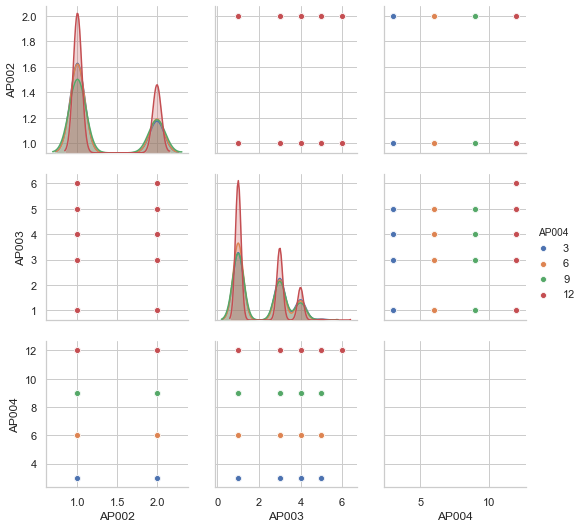

In [43]:
fig = sns.pairplot(df[['AP002', 'AP003', 'AP004']], 
             hue= 'AP004')
fig

# 4. GLM  and Auto-ML Model <a class="anchor" id="Section_4"></a>

#### Use the non-binned data, fill NA's with Iterative Imputer Median

### Using the median imputed values from the Iterative Imputer

In [44]:
# Over write the NA value columns, with the previously calculated values
df[features_nan] = imputed_data_median

In [45]:
df.head(2)

,loan_default,AP001,AP002,AP003,AP004,AP006,AP007,AP008,AP009,TD001,...,CD169,CD170,CD172,CD173,MB005,MB007,Loan_app_day_name,Loan_app_month,Loan_app_time,Loan_app_day
0,1,31,2,1,12,ios,3,3,1,1,...,1449,1449,2249,2249,7,IPHONE7,Thursday,July,10:21:00,6
1,0,27,1,1,12,h5,5,4,0,2,...,1086,939,1651,1425,5,WEB,Thursday,April,12:51:00,6


In [46]:
df.isnull().sum().sum()

0

## 4.1. Generalized Linear Regression (GLM) Model using H2O<a class="anchor" id="Section_41"></a>

In [47]:
import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O_cluster_uptime:,3 days 10 hours 17 mins
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.30.1.3
H2O_cluster_version_age:,1 month and 21 days
H2O_cluster_name:,H2O_from_python_harshdhanuka_ia8hyc
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,946 Mb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


### Splitting the data to train-test, and  convert to h2o format

I will use a 72:25 split for train and test.

In [48]:
# Split the data
train,test = train_test_split(df,test_size = 0.25, random_state = 1234)

# Convert to a  h2o dataframe for computation
df_hex = h2o.H2OFrame(df)
train_hex = h2o.H2OFrame(train)
test_hex = h2o.H2OFrame(test)

# This test_hex will be used all througout the models, for prediction

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


### Balance the Classes, using Random Over_Sampling

In [49]:
df.loan_default.value_counts()

0    64512
1    15488
Name: loan_default, dtype: int64

In [50]:
target = 'loan_default'

# I will make both the classes equal
y = df[target]
X = df.drop(target,axis=1)
y.dtypes


from imblearn.over_sampling import RandomOverSampler
sampler = RandomOverSampler(sampling_strategy={1: 64512, 0: 64512},random_state=0)

X_rs, y_rs = sampler.fit_sample(X, y)
print('RandomOverSampler {}'.format(Counter(y_rs)))
    
X_rs = pd.DataFrame(X_rs)
y_rs = pd.DataFrame(y_rs)

smpl = pd.concat([X_rs,y_rs], axis = 1)

train,test = train_test_split(smpl,test_size = 0.25, random_state = 1234)

# Convert to a  h2o dataframe for computation
train_hex = h2o.H2OFrame(train)

RandomOverSampler Counter({1: 64512, 0: 64512})
Parse progress: |█████████████████████████████████████████████████████████| 100%


### Define the target and predictor variables

In [51]:
# Selecting all independent variables as predictor variables

predictors = ['AP001', 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       'AP008', 'AP009', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR009', 'CR015', 'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005',
       'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       'Loan_app_day']

target = 'loan_default'

In [52]:
len(predictors)

75

In [53]:
len(df.columns.to_list())

76

## 4.1.1. H2O Grid Search for Optimum GLM Model Hyper Parameters <a class="anchor" id="Section_411"></a>

H2O supports two types of grid search – traditional (or “cartesian”) grid search and random grid search. In a cartesian grid search, users specify a set of values for each hyperparameter that they want to search over, and H2O will train a model for every combination of the hyperparameter values. This means that if you have three hyperparameters and you specify 5, 10 and 2 values for each, your grid will contain a total of 5 * 10 * 2 = 100 models.

In random grid search, the user specifies the hyperparameter space in the exact same way, except H2O will sample uniformly from the set of all possible hyperparameter value combinations. In random grid search, the user also specifies a stopping criterion, which controls when the random grid search is completed. The user can tell the random grid search to stop by specifying a maximum number of models or the maximum number of seconds allowed for the search. The user may also specify a performance-metric-based stopping criterion, which will stop the random grid search when the performance stops improving by a specified amount.

Once the grid search is complete, the user can query the grid object and sort the models by a particular performance metric (for example, “AUC”). All models are stored in the H2O cluster and are accessible by model id.

Examples of how to perform cartesian and random grid search in all of H2O’s APIs follow below. There are also longer grid search tutorials available for R and Python.

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/grid-search.html 

### Find-tune hyper-parameters in h2o.gbm

H2O supports two types of grid search – traditional (or “cartesian”) grid search and random grid search. In a cartesian grid search, users specify a set of values for each hyperparameter that they want to search over, and H2O will train a model for every combination of the hyperparameter values. This means that if you have three hyperparameters and you specify 5, 10 and 2 values for each, your grid will contain a total of `5*10*2` = 100 models.

In random grid search, the user specifies the hyperparameter space in the exact same way, except H2O will sample uniformly from the set of all possible hyperparameter value combinations. In random grid search, the user also specifies a stopping criterion, which controls when the random grid search is completed. The user can tell the random grid search to stop by specifying a maximum number of models or the maximum number of seconds allowed for the search. The user may also specify a performance-metric-based stopping criterion, which will stop the random grid search when the performance stops improving by a specified amount.

Once the grid search is complete, the user can query the grid object and sort the models by a particular performance metric (for example, “AUC”). All models are stored in the H2O cluster and are accessible by model id.

The overall strategy is to test lambda and alpha. The hyperparameters for tuning are the following:

GLM Hyperparameters
- seed
- tweedie_variance_power
- tweedie_link_power
- alpha
- lambda
- missing_values_handling
- standardize

Here, I will tune only `lambda` and `aplha`.

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/grid-search.html

### Grid Search for best hyper parameters

In [54]:
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# select the values for lambda_ to grid over
hyper_params = {'lambda': [1, 0.5, 0.03, 0.02, 0.1, 0.01, 0.05, 0.08, 0.001, 0.003, 0.005, 0.0001, 0.0005, 0.00001, 0],
               'alpha': [1, 0.5, 0]}

# initialize the glm estimator
glm_grid = H2OGeneralizedLinearEstimator(family = 'fractionalbinomial')

# build grid search with previously made GLM and hyperparameters
grid = H2OGridSearch(model = glm_grid, 
                     hyper_params = hyper_params,                     
                     search_criteria = {'strategy': "Cartesian"})

# train using the grid
grid.train(x = predictors, y = target, training_frame = train_hex, validation_frame = test_hex)

glm Grid Build progress: |████████████████████████████████████████████████| 100%


### Check Results of Grid Search Model

In [55]:
# sort the grid models by decreasing 'rmse'
grid_table1 = grid.get_grid(sort_by = 'rmse', decreasing = False)
print('')
print("The grid search models as per decreasing 'rmse' is as  follows: ")
print('')
print(grid_table1)


The grid search models as per decreasing 'rmse' is as  follows: 

      alpha    lambda  \
0     [1.0]     [0.0]   
1     [0.5]     [0.0]   
2     [0.0]     [0.0]   
3     [0.0]  [1.0E-5]   
4     [0.5]  [1.0E-5]   
5     [1.0]  [1.0E-5]   
6     [0.0]  [1.0E-4]   
7     [0.0]  [5.0E-4]   
8     [0.5]  [1.0E-4]   
9     [0.0]   [0.001]   
10    [1.0]  [1.0E-4]   
11    [0.0]   [0.003]   
12    [0.5]  [5.0E-4]   
13    [0.0]   [0.005]   
14    [0.0]    [0.01]   
15    [1.0]  [5.0E-4]   
16    [0.5]   [0.001]   
17    [0.0]    [0.02]   
18    [1.0]   [0.001]   
19    [0.0]    [0.03]   
20    [0.5]   [0.003]   
21    [0.5]   [0.005]   
22    [0.0]    [0.05]   
23    [1.0]   [0.003]   
24    [0.0]    [0.08]   
25    [1.0]   [0.005]   
26    [0.5]    [0.01]   
27    [0.0]     [0.1]   
28    [1.0]    [0.01]   
29    [0.5]    [0.02]   
30    [0.5]    [0.03]   
31    [1.0]    [0.02]   
32    [0.0]     [0.5]   
33    [0.5]    [0.05]   
34    [1.0]    [0.03]   
35    [0.0]     [1.0]   
36    [0

In [56]:
grid_sorted2 = grid.get_grid(sort_by='r2',decreasing=True)
# print(grid_sorted2)

In [57]:
best_glm = grid_sorted2.models[0]
print(best_glm)

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  Grid_GLM_Key_Frame__upload_92737cf361c67c5cb81cc6420eec4541.hex_model_python_1605465842045_16_model_43


GLM Model: summary


,,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,fractionalbinomial,logit,None,198,198,7,Key_Frame__upload_92737cf361c67c5cb81cc6420eec4541.hex




ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.2196672549573031
RMSE: 0.4686867343517449
LogLoss: 0.6289880255591355
Null degrees of freedom: 96767
Residual degrees of freedom: 96569
Null deviance: 134148.93269552413
Residual deviance: 121731.82651461284
AIC: 122129.82651461284
AUC: 0.699018585323411
AUCPR: 0.6779824604560751
Gini: 0.398037170646822

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3710743619375377: 


,,0,1,Error,Rate
0,0,16493.0,31892.0,0.6591,(31892.0/48385.0)
1,1,5618.0,42765.0,0.1161,(5618.0/48383.0)
2,Total,22111.0,74657.0,0.3876,(37510.0/96768.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.371074,0.695140,270.0
1,max f2,0.181113,0.837127,355.0
2,max f0point5,0.502015,0.644935,194.0
3,max accuracy,0.493233,0.645637,199.0
4,max precision,0.999185,1.000000,0.0
5,max recall,0.000802,1.000000,399.0
6,max specificity,0.999185,1.000000,0.0
7,max absolute_mcc,0.485076,0.291928,204.0
8,max min_per_class_accuracy,0.507320,0.642348,191.0
9,max mean_per_class_accuracy,0.493233,0.645638,199.0



ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.22143218352023294
RMSE: 0.47056581210308185
LogLoss: 0.631806459258408
Null degrees of freedom: 19999
Residual degrees of freedom: 19801
Null deviance: 27725.38442009621
Residual deviance: 25272.258370336316
AIC: 25670.258370336316
AUC: 0.6968015788659435
AUCPR: 0.35114726138823904
Gini: 0.39360315773188703

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5143377777541557: 


,,0,1,Error,Rate
0,0,10575.0,5507.0,0.3424,(5507.0/16082.0)
1,1,1453.0,2465.0,0.3709,(1453.0/3918.0)
2,Total,12028.0,7972.0,0.348,(6960.0/20000.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.514338,0.414634,171.0
1,max f2,0.341697,0.580533,278.0
2,max f0point5,0.644016,0.377030,97.0
3,max accuracy,0.830391,0.805300,23.0
4,max precision,0.999311,0.800000,0.0
5,max recall,0.000813,1.000000,399.0
6,max specificity,0.999311,0.999938,0.0
7,max absolute_mcc,0.539888,0.233933,156.0
8,max min_per_class_accuracy,0.507883,0.641654,175.0
9,max mean_per_class_accuracy,0.497990,0.644613,181.0



Scoring History: 


,,timestamp,duration,iterations,negative_log_likelihood,objective,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2020-11-19 00:03:16,0.000 sec,0,67074.466348,0.693147,,,,,,,,,,,,,,
1,,2020-11-19 00:03:17,0.382 sec,1,61006.247575,0.630438,,,,,,,,,,,,,,
2,,2020-11-19 00:03:17,0.564 sec,2,60871.509105,0.629046,,,,,,,,,,,,,,
3,,2020-11-19 00:03:17,0.734 sec,3,60867.528820,0.629005,,,,,,,,,,,,,,
4,,2020-11-19 00:03:17,0.943 sec,4,60866.481280,0.628994,,,,,,,,,,,,,,
5,,2020-11-19 00:03:18,1.125 sec,5,60866.102566,0.628990,,,,,,,,,,,,,,
6,,2020-11-19 00:03:18,1.296 sec,6,60865.964088,0.628989,,,,,,,,,,,,,,
7,,2020-11-19 00:03:18,1.469 sec,7,60865.913257,0.628988,0.468687,0.628988,0.121331,NaN,NaN,NaN,0.387628,0.470566,0.631806,-0.405712,0.696802,0.351147,NaN,0.348


#### Observation:

I see that as per above displayed R square and rmse values, the most optimum parameters for the GLM model are:
- lambda = 0
- alpha = 1

I will now build the GLM Models based on these optimum hyper parameters.

## 4.1.2. H2O GLM 'without' Regularization Model <a class="anchor" id="Section_412"></a>

The lambda value will be left at 0.

In [58]:
GLM_WO = H2OGeneralizedLinearEstimator(family= "fractionalbinomial",
                                        lambda_ = 0,  # No regularization
                                        compute_p_values = True)

GLM_WO.train(predictors, target, training_frame= train_hex, validation_frame = test_hex)

glm Model Build progress: |███████████████████████████████████████████████| 100%


### Check Variable Importance

In [59]:
var_imps = pd.DataFrame(GLM_WO.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])

### Re-build Model with 30 most Important features

The model total has 75 features. After running the initial model with all features, I run many different combinations to get the best LIFT score. I see that the LIFT is best with all the features in the model. So, I will not perform variable importance selection.

#### I tried selecting many different combination of features, but the best Lift was given by all features.

In [60]:
#predictors = var_imps['Variable'].head(30).to_list()

# target = 'loan_default'

In [61]:
# GLM_WO = H2OGeneralizedLinearEstimator(family= "fractionalbinomial",
#                                        lambda_ = 0,  # No regularization
#                                        compute_p_values = True)

# GLM_WO.train(predictors, target, training_frame= train_hex, validation_frame = test_hex)

### Check Variable Importance as per original model

In [62]:
var_imps = pd.DataFrame(GLM_WO.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])
print()
print("The 10 most important features are: ")
print()

var_imps.head(10)


The 10 most important features are: 



,Variable,Relative_Importance,Scaled_Importance,Percentage
0,MB007.VERIZON,9.934424,1.000000,0.020519
1,MB007.GO,9.562379,0.962550,0.019750
2,MB007.TCL,8.773020,0.883093,0.018120
3,MB007.SM-W2016,8.704416,0.876187,0.017978
4,MB007.APPLE,8.611397,0.866824,0.017786
5,MB007.X6,8.562345,0.861886,0.017685
6,MB007.SKYHON,8.502738,0.855886,0.017562
7,MB007.EYU,8.500020,0.855613,0.017556
8,MB007.IPAD3,8.467759,0.852365,0.017490
9,MB007.BEN13,8.334609,0.838963,0.017215


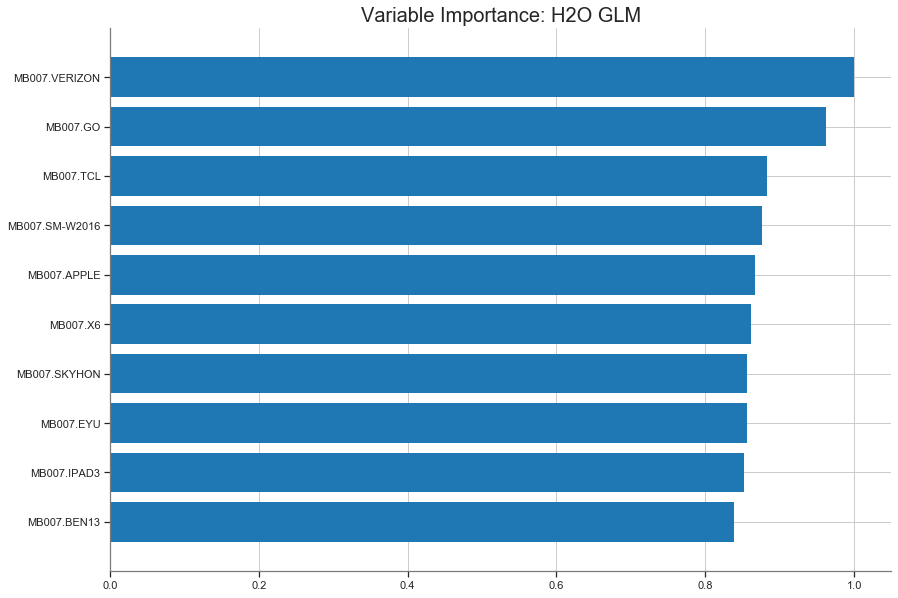

In [63]:
GLM_WO.varimp_plot()

### Predict on Test Set

Use the original `test_hex` set for prediction

In [64]:
y_pred = GLM_WO.predict(test_hex).as_data_frame()
y_actual = test_hex[target].as_data_frame()
y_pred.head()

glm prediction progress: |████████████████████████████████████████████████| 100%


,predict,p0,p1,StdErr
0,1,0.434624,0.565376,0.068718
1,0,0.922128,0.077872,0.061973
2,1,0.325746,0.674254,0.089567
3,1,0.458535,0.541465,0.060323
4,0,0.888699,0.111301,0.086072


### ROC and Area Under Curve

A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The method was developed for operators of military radar receivers, which is why it is so named.

In [65]:
GLM_WO_actual_predict = pd.concat([y_actual,y_pred['predict']],axis=1)
GLM_WO_actual_predict.columns = ['actual','pred']
print(GLM_WO_actual_predict.head())

GLM_WO_roc_auc_value = roc_auc_score(GLM_WO_actual_predict['actual'],GLM_WO_actual_predict['pred'])
print('\n' + 'The AUC is: ')
GLM_WO_roc_auc_value

   actual  pred
0       0     1
1       0     0
2       0     1
3       0     1
4       0     0

The AUC is: 


0.643169507296037

### Gain Table

In [66]:
def gains_table(df_actual_predict):
    df_actual_predict = df_actual_predict.sort_values(by='pred',ascending=False)
    df_actual_predict['row_id'] = range(0,0+len(df_actual_predict))
    
    df_actual_predict['decile'] = (df_actual_predict['row_id'] / (len(df_actual_predict)/10)).astype(int)
    df_actual_predict.loc[df_actual_predict['decile'] == 10] =9
    
    # Create gains table
    gains = df_actual_predict.groupby('decile')['actual'].agg(['count','sum'])
    gains.columns = ['count','actual']
    gains

    gains['non_actual'] = gains['count'] - gains['actual']
    gains['cum_count'] = gains['count'].cumsum()
    gains['cum_actual'] = gains['actual'].cumsum()
    gains['cum_non_actual'] = gains['non_actual'].cumsum()
    gains['percent_cum_actual'] = (gains['cum_actual'] / np.max(gains['cum_actual'])).round(2)
    gains['percent_cum_non_actual'] = (gains['cum_non_actual'] / np.max(gains['cum_non_actual'])).round(2)
    gains['if_random'] = np.max(gains['cum_actual']) /10
    gains['if_random'] = gains['if_random'].cumsum()
    gains['lift'] = (gains['cum_actual'] / gains['if_random']).round(2)
    gains['K_S'] = np.abs( gains['percent_cum_actual'] - gains['percent_cum_non_actual']  ) * 100 
    gains['gain'] = (gains['cum_actual'] / gains['cum_count']*100).round(2)
    return(gains)

In [67]:
GLM_gains = gains_table(GLM_WO_actual_predict)
GLM_gains

,count,actual,non_actual,cum_count,cum_actual,cum_non_actual,percent_cum_actual,percent_cum_non_actual,if_random,lift,K_S,gain
decile,,,,,,,,,,,,
0,2000,611,1389,2000,611,1389,0.16,0.09,391.8,1.56,7.0,30.55
1,2000,604,1396,4000,1215,2785,0.31,0.17,783.6,1.55,14.0,30.38
2,2000,635,1365,6000,1850,4150,0.47,0.26,1175.4,1.57,21.0,30.83
3,2000,613,1387,8000,2463,5537,0.63,0.34,1567.2,1.57,29.0,30.79
4,2000,266,1734,10000,2729,7271,0.70,0.45,1959.0,1.39,25.0,27.29
5,2000,225,1775,12000,2954,9046,0.75,0.56,2350.8,1.26,19.0,24.62
6,2000,241,1759,14000,3195,10805,0.82,0.67,2742.6,1.16,15.0,22.82
7,2000,222,1778,16000,3417,12583,0.87,0.78,3134.4,1.09,9.0,21.36
8,2000,243,1757,18000,3660,14340,0.93,0.89,3526.2,1.04,4.0,20.33


### ROC with Precision Recall

In [68]:
def ROC_PR(df_actual_predict):
    
    print('')
    print('   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate')
    print('')
    print('   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy')
    print('')
    print('   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)')
    print('')
    
    #  ROC
    roc_auc_value = roc_auc_score(df_actual_predict['actual'],df_actual_predict['pred'])
    fpr, tpr, _ = roc_curve(df_actual_predict['actual'],df_actual_predict['pred'])
    roc_auc = auc(fpr,tpr)
    
    lw=2
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.plot(fpr,tpr, color='darkorange',lw=lw,label='AUC = %0.4f)' %roc_auc_value)
    plt.plot([0,1],[0,1], color='navy',lw=lw,linestyle='--')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve: AUC={0:0.4f}'.format(roc_auc_value))
    plt.legend(loc='lower right')
    
    # Precision-Recall
    plt.subplot(1,2,2)
    average_precision = average_precision_score(df_actual_predict['actual'],df_actual_predict['pred'])
    precision, recall, _ = precision_recall_curve(df_actual_predict['actual'],df_actual_predict['pred'])
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall,precision,step='post',alpha=0.2,color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0,1.05])
    plt.ylim([0.0,1.05])
    plt.title('Precision-Recall curve: PR={0:0.4f}'.format(average_precision))


   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate

   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy

   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)



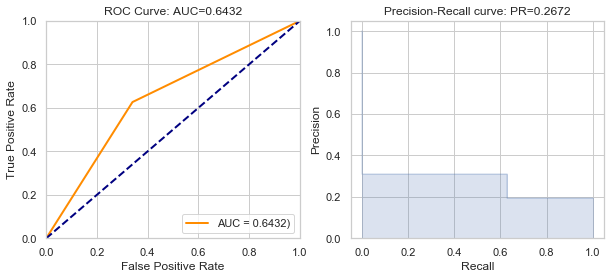

In [69]:
ROC_PR(GLM_WO_actual_predict)

## 4.1.2. H2O GLM with Regularization Model <a class="anchor" id="Section_412"></a>

I will use the optimal parameters given by the Grid Search function.

In [70]:
GLM_WITH = H2OGeneralizedLinearEstimator(family = "AUTO",
                                         lambda_ = 0,
                                         lambda_search = True,
                                         alpha = 1,
                                         seed = 1234,
                                         nfolds = 10,
                                         stopping_rounds = 0,
                                         standardize = True)

GLM_WITH.train(predictors, target, training_frame= train_hex)

glm Model Build progress: |███████████████████████████████████████████████| 100%


### Check Variable Importance

In [71]:
var_imps = pd.DataFrame(GLM_WO.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])

### Re-build Model with 30 most Important features

The model total has 75 features. After running the initial model with all features, I run many different combinations to get the best LIFT score. I see that the LIFT is best with all the features in the model. So, I will not perform variable importance selection.

#### I tried selecting many different combination of features, but the best Lift was given by all features.

In [72]:
#predictors = var_imps['Variable'].head(30).to_list()

# target = 'loan_default'

In [73]:
# GLM_WITH = H2OGeneralizedLinearEstimator(family = "AUTO",
#                                         lambda_search = True,
#                                         alpha = 1,
#                                         seed = 1234,
#                                         nfolds = 10,
#                                         stopping_rounds = 0,
#                                         standardize = True)

# GLM_WITH.train(predictors, target, training_frame= train_hex)

### Check Variable Importance as per original model

In [74]:
var_imps = pd.DataFrame(GLM_WO.varimp(), columns = ['Variable', 'Relative_Importance', 
                                               'Scaled_Importance', 'Percentage'])
print()
print("The 10 most important features are: ")
print()

var_imps.head(10)


The 10 most important features are: 



,Variable,Relative_Importance,Scaled_Importance,Percentage
0,MB007.VERIZON,9.934424,1.000000,0.020519
1,MB007.GO,9.562379,0.962550,0.019750
2,MB007.TCL,8.773020,0.883093,0.018120
3,MB007.SM-W2016,8.704416,0.876187,0.017978
4,MB007.APPLE,8.611397,0.866824,0.017786
5,MB007.X6,8.562345,0.861886,0.017685
6,MB007.SKYHON,8.502738,0.855886,0.017562
7,MB007.EYU,8.500020,0.855613,0.017556
8,MB007.IPAD3,8.467759,0.852365,0.017490
9,MB007.BEN13,8.334609,0.838963,0.017215


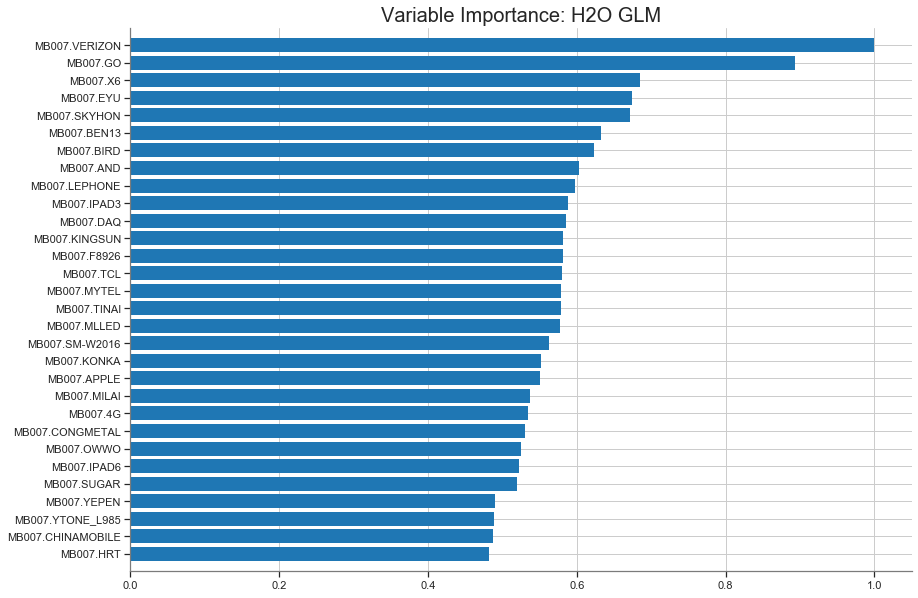

In [75]:
GLM_WITH.varimp_plot(num_of_features = 30)

### Predict on Test Set

Use the original `test_hex` set for prediction

In [76]:
y_pred = GLM_WITH.predict(test_hex).as_data_frame()
y_actual = test_hex[target].as_data_frame()
y_pred.head()

glm prediction progress: |████████████████████████████████████████████████| 100%


,predict
0,0.558999
1,-0.001521
2,0.646221
3,0.530468
4,0.068886


In [77]:
GLM_WITH_actual_predict = pd.concat([y_actual,y_pred['predict']],axis=1)
GLM_WITH_actual_predict.columns = ['actual','pred']
GLM_WITH_actual_predict.head()

,actual,pred
0,0,0.558999
1,0,-0.001521
2,0,0.646221
3,0,0.530468
4,0,0.068886


### ROC and Area Under Curve

A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The method was developed for operators of military radar receivers, which is why it is so named.

In [78]:
GLM_WITH_roc_auc_value = roc_auc_score(GLM_WITH_actual_predict['actual'],GLM_WITH_actual_predict['pred'])
GLM_WITH_roc_auc_value

0.695888046706012

### Gain Table

In [79]:
GLM_gains = gains_table(GLM_WITH_actual_predict)
GLM_gains

,count,actual,non_actual,cum_count,cum_actual,cum_non_actual,percent_cum_actual,percent_cum_non_actual,if_random,lift,K_S,gain
decile,,,,,,,,,,,,
0,2000,849,1151,2000,849,1151,0.22,0.07,391.8,2.17,15.0,42.45
1,2000,628,1372,4000,1477,2523,0.38,0.16,783.6,1.88,22.0,36.93
2,2000,523,1477,6000,2000,4000,0.51,0.25,1175.4,1.70,26.0,33.33
3,2000,458,1542,8000,2458,5542,0.63,0.34,1567.2,1.57,29.0,30.72
4,2000,385,1615,10000,2843,7157,0.73,0.45,1959.0,1.45,28.0,28.43
5,2000,298,1702,12000,3141,8859,0.80,0.55,2350.8,1.34,25.0,26.17
6,2000,292,1708,14000,3433,10567,0.88,0.66,2742.6,1.25,22.0,24.52
7,2000,229,1771,16000,3662,12338,0.93,0.77,3134.4,1.17,16.0,22.89
8,2000,178,1822,18000,3840,14160,0.98,0.88,3526.2,1.09,10.0,21.33


### Coefficients Table

Check the variable coefficients and standardized coefficients

In [80]:
coefs = GLM_WITH._model_json['output']['coefficients_table'].as_data_frame()
coefs = pd.DataFrame(coefs)
coefs.sort_values(by='standardized_coefficients',ascending=False)

,names,coefficients,standardized_coefficients
86,MB007.TCL,0.552087,0.552087
82,MB007.SM-W2016,0.534895,0.534895
6,MB007.APPLE,0.523442,0.523442
0,Intercept,0.207807,0.499990
60,MB007.MC-X7MINI,0.450366,0.450366
...,...,...,...
81,MB007.SKYHON,-0.639009,-0.639009
22,MB007.EYU,-0.641403,-0.641403
97,MB007.X6,-0.651924,-0.651924
26,MB007.GO,-0.850162,-0.850162


### ROC with Precision Recall


   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate

   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy

   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)



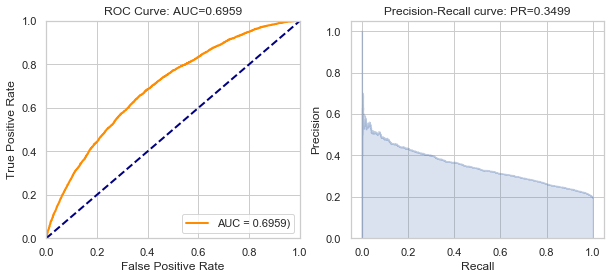

In [81]:
ROC_PR(GLM_WITH_actual_predict)

### Observations:

I see that in the GLM models, the one With Regularization, the result is satisfactory.

In our dataset, the minority class represents 19.3% or around 1/5th of the total data, and the majority class represents  81.7% or 4/5th of the total data, or around 4 times the minority class. The underlying assumption for the stable results is that this dataset is not a bad distribution of class, and 20% data in a one class is fine for building a stable model. If we had more than 5-6 times of the minority class data in the majority class, then that would be be settled well by the `balance_class` parameter in the model. However, to develop a better model I chose to manually oversample the minority class.

I also observed that for this regression problem, balance classes parameter did not make any difference.

Also, for the train test split, I found that a split of 75:25 works best for all my models. I tried other combination, but a 75% train gives me the best Lift score of 2.17. So, I will continue with the same split ratio further.

The optimum hyper-parameters for the GLM model built above are:
- family = "AUTO",
- lambda_ = 0,
- lambda_search = True,
- alpha = 1,
- seed = 1234,
- nfolds = 10,
- stopping_rounds = 0,
- standardize = True

Please see below for the meaningful business insights:

### Business Insight:

H2O package is a very effective and efficient package to build a machine learning model for predicting loan default. Also, H2O package is very handy to display the variable importance, handle correlations, and also dummy code the categorical variables. 

Gains table and Lift:
For the final model I built after tuning all the models on various different values of each parameter and finally tuning all the hyper-parameters for the best result, the highest `Lift` score I obtaned is 2.17, which is good as per industry standards. A Lift score of above 2 is suitable for the model to be of acceptable standards.

ROC and AUC:
The area under the ROC curve (AUC) assesses overall classification performance. But, AUC does not place more emphasis on one class over the other, so it does not reflect the minority class well. The Precision-Recall (PR) curves will be more informative than ROC when dealing with highly skewed datasets. The PR curves plot precision vs. recall (FPR). Because Precision is directly influenced by class imbalance so the Precision-recall curves are better to highlight differences between models for highly imbalanced data sets. 

However, both of them do not accurately represent the results, as one doesnt reflect the minority class well, and the other is sensitive to imbalanced data. Hence, we use the H2O package, which takes care of all these problems for us. We get an AUC of 0.69 and PR of 0.35, which is acceptable, but I will try to improve them further in my following models.

The major outcome of this excercise is that GLM is a good model to predict loan default, as per the given data. However, we should not undermine other good boosting models such as xgboost, or RF, or Auto-ML and others. These might provide better results as well. 

Further, as per this model, the most important variables are:
- MB007 which is the  device/operating system type 

## 4.2. Auto-ML (Automatic Machine Learning) Model <a class="anchor" id="Section_42"></a>

In [82]:
from h2o.automl import H2OAutoML

In [83]:
# Split the data
train,test = train_test_split(df,test_size = 0.30, random_state = 1234)

# Convert to a  h2o dataframe for computation
df_hex = h2o.H2OFrame(df)
train_hex = h2o.H2OFrame(train)
test_hex = h2o.H2OFrame(test)

# This test_hex will be used all througout the models, for prediction

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


### Define the target and predictor variables

In [84]:
# Selecting all predictor variables

predictors = ['AP001', 'AP002', 'AP003', 'AP004', 'AP006', 'AP007',
       'AP008', 'AP009', 'TD001', 'TD002', 'TD005', 'TD006', 'TD009', 'TD010',
       'TD013', 'TD014', 'TD015', 'TD022', 'TD023', 'TD024', 'CR004', 'CR005',
       'CR009', 'CR015', 'CR017', 'CR018', 'CR019', 'PA022', 'PA023', 'PA028',
       'PA029', 'PA030', 'PA031', 'CD008', 'CD018', 'CD071', 'CD072', 'CD088',
       'CD100', 'CD101', 'CD106', 'CD107', 'CD108', 'CD113', 'CD114', 'CD115',
       'CD117', 'CD118', 'CD120', 'CD121', 'CD123', 'CD130', 'CD131', 'CD132',
       'CD133', 'CD135', 'CD136', 'CD137', 'CD152', 'CD153', 'CD160', 'CD162',
       'CD164', 'CD166', 'CD167', 'CD169', 'CD170', 'CD172', 'CD173', 'MB005',
       'MB007', 'Loan_app_day_name', 'Loan_app_month', 'Loan_app_time',
       'Loan_app_day']

target = 'loan_default'

In [85]:
len(predictors)

75

In [86]:
len(df.columns.to_list())

76

### Grid Search for Auto ML Model

AutoML performs a hyperparameter search over a variety of H2O algorithms in order to deliver the best model. In the table on the link given, we list the hyperparameters, along with all potential values that can be randomly chosen in the search. If these models also have a non-default value set for a hyperparameter, we identify it in the list as well. Random Forest and Extremely Randomized Trees are not grid searched (in the current version of AutoML), so they are not included in the list.

AutoML does not run a grid search for GLM. Instead AutoML builds a single model with lambda_search enabled and passes a list of alpha values. It returns only the model with the best alpha-lambda combination rather than one model for each alpha.

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html

The `max_runtime_secs` argument provides a way to limit the AutoML run by time.  When using a time-limited stopping criterion, the number of models train will vary between runs.  If different hardware is used or even if the same machine is used but the available compute resources on that machine are not the same between runs, then AutoML may be able to train more models on one run vs another. 

The `test` frame is passed explicitly to the `leaderboard_frame` argument here, which means that instead of using cross-validated metrics, we use test set metrics for generating the leaderboard.

In [87]:
### No more supported in latest version of H20 Auto ML. It runs by default.

# select the values for parameters to grid over
# hyper_params = {'max_runtime_secs': [100, 300, 500, 800, 1000, 1500, 1800, 2000],
#               'max_models': [10, 20, 50, 100, 150, 200, 250, 300, 500]}

# initialize the glm estimator
# aml_grid = H2OAutoML()

# build grid search with previously made GLM and hyperparameters
# grid = H2OGridSearch(aml_grid, 
#                     hyper_params = hyper_params)

# train using the grid
# grid.train(x = predictors, y = target, training_frame = train_hex, validation_frame = test_hex)

### Build the H2O Auto-ML Model

I will manually specify the basic parameters required to run the model. 


The current version of AutoML trains and cross-validates the following algorithms (in the following order): three pre-specified XGBoost GBM (Gradient Boosting Machine) models, a fixed grid of GLMs, a default Random Forest (DRF), five pre-specified H2O GBMs, a near-default Deep Neural Net, an Extremely Randomized Forest (XRT), a random grid of XGBoost GBMs, a random grid of H2O GBMs, and a random grid of Deep Neural Nets. In some cases, there will not be enough time to complete all the algorithms, so some may be missing from the leaderboard. AutoML then trains two Stacked Ensemble models (more info about the ensembles below). Particular algorithms (or groups of algorithms) can be switched off using the exclude_algos argument. 

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html

In [88]:
aml_1 = H2OAutoML(project_name = 'aml_1',
                  max_runtime_secs = 1800, # 30 minutes
                  max_models = 200, # test over 200 different models
                  nfolds = 5,   # 5 fold cross validation for each model
                  stopping_rounds = 0,
                  stopping_tolerance = 0.005,
                  balance_classes = False,  # True only for classification problem
                  seed = 1234)

aml_1.train(x = predictors, 
            y = target, 
            training_frame = train_hex)

AutoML progress: |
10:31:43.80: Stopping tolerance set by the user is < 70% of the recommended default of 0.004225771273642583, so models may take a long time to converge or may not converge at all.
10:31:43.81: New models will be added to existing leaderboard aml_1@@loan_default (leaderboard frame=null) with already 21 models.
10:32:58.863: DeepLearning_1_AutoML_20201118_103143 [DeepLearning def_1] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for DeepLearning model: DeepLearning_1_AutoML_20201118_103143_cv_1.  Details: ERRR on field: _balance_classes: balance_classes requires classification.

10:34:52.685: StackedEnsemble_BestOfFamily_AutoML_20201118_103143 [StackedEnsemble best (built using top model from each algorithm type)] failed: water.exceptions.H2OIllegalArgumentException: Base models are inconsistent: they use different size (number of rows) training frames. Found: 56000 (StackedEnsemble) and 40000 (model GBM_grid__1_AutoML_20201115_13

### Leaderboard

We will view the AutoML Model Leaderboard. Since we specified a `leaderboard_frame` in the `H2OAutoML.train()` method for scoring and ranking the models, the AutoML leaderboard uses the performance on this data to rank the models.

The AutoML object includes a “leaderboard” of models that were trained in the process, including the 5-fold cross-validated model performance (by default). The number of folds used in the model evaluation process can be adjusted using the nfolds parameter. If you would like to score the models on a specific dataset, you can specify the leaderboard_frame argument in the AutoML run, and then the leaderboard will show scores on that dataset instead.

A default performance metric for each machine learning task (binary classification, multiclass classification, regression) is specified internally and the leaderboard will be sorted by that metric.  In the case of regression, the default ranking metric is mean residual deviance.  In the future, the user will be able to specify any of the H2O metrics so that different metrics can be used to generate rankings on the leaderboard.

In [89]:
lb = aml_1.leaderboard.head()
lb

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_AutoML_20201115_134511,0.144316,0.379889,0.144316,0.289444,0.266695
StackedEnsemble_BestOfFamily_AutoML_20201115_134511,0.144401,0.380001,0.144401,0.289787,0.26678
DeepLearning_1_AutoML_20201119_000411,0.14468,0.380368,0.14468,0.28864,0.2675
GBM_1_AutoML_20201119_000411,0.144875,0.380624,0.144875,0.291861,0.266881
DeepLearning_1_AutoML_20201118_233816,0.14498,0.380762,0.14498,0.287473,0.26728
GBM_1_AutoML_20201118_233816,0.145052,0.380857,0.145052,0.288206,0.267876
GLM_1_AutoML_20201118_233816,0.14517,0.381012,0.14517,0.293897,0.267859
GLM_1_AutoML_20201119_000411,0.14517,0.381012,0.14517,0.293897,0.267859
GLM_1_AutoML_20201118_233253,0.145208,0.381061,0.145208,0.293963,0.267857
GLM_1_AutoML_20201118_103143,0.145208,0.381061,0.145208,0.293963,0.267857


In [90]:
aml_1.leader

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_AutoML_20201115_134511

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.10833207225643532
RMSE: 0.32913837858328726
MAE: 0.25222123570814825
RMSLE: 0.22839896542958898
R^2: 0.2992501585703694
Mean Residual Deviance: 0.10833207225643532
Null degrees of freedom: 10024
Residual degrees of freedom: 10007
Null deviance: 1549.9276675625902
Residual deviance: 1086.029024370764
AIC: 6206.6134791203285

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.14431569629342617
RMSE: 0.37988905787535676
MAE: 0.28944446919969197
RMSLE: 0.2666950655059487
R^2: 0.07903368024284596
Mean Residual Deviance: 0.14431569629342617
Null degrees of freedom: 39999
Residual degrees of freedom: 39982
Null deviance: 6268.369704604205
Residual deviance: 5772.6278517370465
AIC: 36123.00090854541






### Check Variable Importance

I tried Feature selection based on variable  importance, but it degrades the model performance. So, I will use all the features.

In [91]:
# Check for tree models to grab variable importance

lb[:5,"model_id"]

model_id
StackedEnsemble_AllModels_AutoML_20201115_134511
StackedEnsemble_BestOfFamily_AutoML_20201115_134511
DeepLearning_1_AutoML_20201119_000411
GBM_1_AutoML_20201119_000411
DeepLearning_1_AutoML_20201118_233816


In [92]:
# Stacked Ensemble models cannot give variable importance, so I will grab the third model, which is GBM
m = h2o.get_model(lb[2,"model_id"])
m

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_1_AutoML_20201119_000411


Status of Neuron Layers: predicting loan_default, regression, gaussian distribution, Quadratic loss, 2,211 weights/biases, 40.2 KB, 403,949 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,197,Input,0,,,,,,,,,
1,,2,10,Rectifier,0,0,0,0.0609627,0.224091,0,-0.00271048,0.150763,0.362848,0.26958
2,,3,10,Rectifier,0,0,0,0.00192921,0.00163022,0,-0.0948737,0.284014,0.75656,0.214225
3,,4,10,Rectifier,0,0,0,0.0245738,0.0464059,0,-0.0918248,0.390716,0.659436,0.2864
4,,5,1,Linear,,0,0,0.000557448,0.000520088,0,0.0205119,0.172761,0.316436,1.09713e-154




ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 0.1432884398574705
RMSE: 0.3785345953244835
MAE: 0.27709698644289926
RMSLE: 0.26500051951111325
Mean Residual Deviance: 0.1432884398574705

ModelMetricsRegression: deeplearning
** Reported on cross-validation data. **

MSE: 0.14467998767938905
RMSE: 0.38036822643247825
MAE: 0.28864039692948174
RMSLE: 0.2675004177087413
Mean Residual Deviance: 0.14467998767938905

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.2887664,0.013220267,0.30441496,0.2808899,0.28139198,0.30156234,0.27557296
1,mean_residual_deviance,0.14528053,0.0021824662,0.14733785,0.14363499,0.14306746,0.14785333,0.144509
2,mse,0.14528053,0.0021824662,0.14733785,0.14363499,0.14306746,0.14785333,0.144509
3,r2,0.06749916,0.011170112,0.05248145,0.072027504,0.0792938,0.07436592,0.05932713
4,residual_deviance,0.14528053,0.0021824662,0.14733785,0.14363499,0.14306746,0.14785333,0.144509
5,rmse,0.38114825,0.0028604548,0.38384613,0.37899208,0.37824258,0.384517,0.3801434
6,rmsle,0.2678569,0.00450577,0.2738307,0.26508892,0.2649173,0.27154368,0.26390392



Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2
0,,2020-11-19 00:13:34,0.000 sec,None,0.000000,0,0.0,NaN,NaN,NaN,NaN
1,,2020-11-19 00:13:35,38.393 sec,122225 obs/sec,0.656964,1,36790.0,0.382038,0.145953,0.266668,0.062264
2,,2020-11-19 00:13:37,40.829 sec,149555 obs/sec,7.213375,11,403949.0,0.378535,0.143288,0.277097,0.079383



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,AP004,1.000000,1.000000,0.027964
1,AP003,0.645961,0.645961,0.018063
2,TD013,0.400087,0.400087,0.011188
3,Loan_app_month.July,0.391382,0.391382,0.010944
4,CD113,0.390112,0.390112,0.010909
5,CD114,0.373776,0.373776,0.010452
6,TD014,0.355442,0.355442,0.009939
7,AP002,0.355017,0.355017,0.009928
8,AP006.ios,0.354010,0.354010,0.009899
9,CD106,0.335493,0.335493,0.009382



See the whole table with table.as_data_frame()


In [93]:
print('The top 10 most important variables are: ')
m.varimp(use_pandas=True)[:10]

The top 10 most important variables are: 


,variable,relative_importance,scaled_importance,percentage
0,AP004,1.000000,1.000000,0.027964
1,AP003,0.645961,0.645961,0.018063
2,TD013,0.400087,0.400087,0.011188
3,Loan_app_month.July,0.391382,0.391382,0.010944
4,CD113,0.390112,0.390112,0.010909
5,CD114,0.373776,0.373776,0.010452
6,TD014,0.355442,0.355442,0.009939
7,AP002,0.355017,0.355017,0.009928
8,AP006.ios,0.354010,0.354010,0.009899
9,CD106,0.335493,0.335493,0.009382


### Plot the Variable Importance

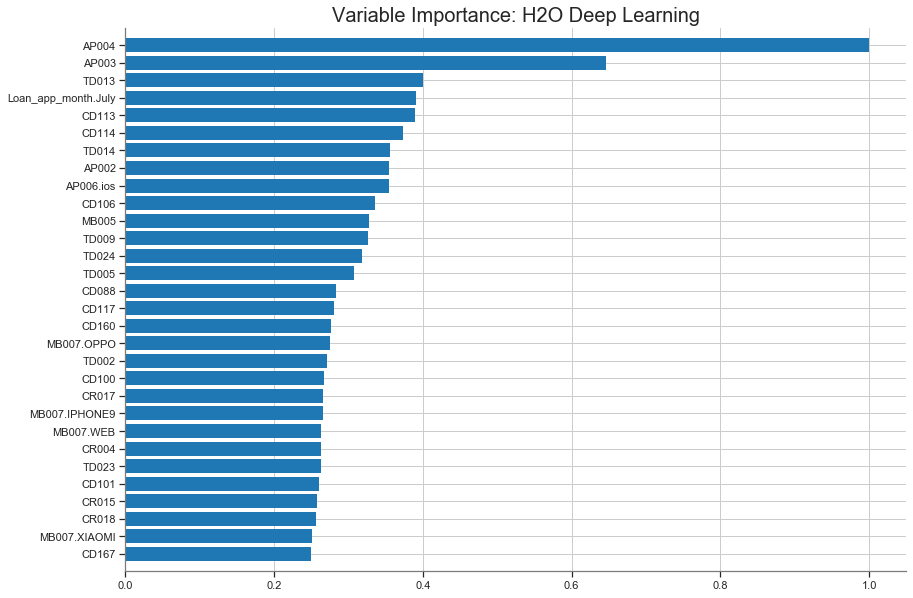

In [94]:
m.varimp_plot(num_of_features = 30)

#### There are also other plots, which might give a better explanation of the model. However, all models, such as stacked ensemble, do not support all graphs. 

These are just for illustrative purpose:

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

- Heatmap
![Heatmap](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_varimp_heatmap_wine.png)

- Correlation Map
![Correlation](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_model_correlation_heatmap_wine.png)

- SHAP Plot
![SHAP Plot](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_shap_summary_wine.png)

- Individual Conditional Expectation (ICE)
![ICE Plot](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/_images/explain_ice_plot_wine_alcohol.png)



### Predict on Test Set

Use the original `test_hex` set for prediction

In [95]:
def actual_predict(model,test_hex,target):
    y_pred = model.predict(test_hex).as_data_frame()
    y_actual = test_hex[target].as_data_frame()
    df_actual_predict = pd.concat([y_actual,y_pred],axis=1)
    df_actual_predict.columns = ['actual','pred']
    return(df_actual_predict)

In [96]:
y_pred = aml_1.predict(test_hex).as_data_frame()
y_actual = test_hex[target].as_data_frame()
y_pred.head()

stackedensemble prediction progress: |████████████████████████████████████| 100%


,predict
0,0.238320
1,-0.001135
2,0.320057
3,0.248219
4,0.055632


In [97]:
AML_actual_predict = actual_predict(aml_1,test_hex,target)
AML_actual_predict.head()

stackedensemble prediction progress: |████████████████████████████████████| 100%


,actual,pred
0,0,0.238320
1,0,-0.001135
2,0,0.320057
3,0,0.248219
4,0,0.055632


In [98]:
pred = aml_1.predict(test_hex)
pred.head()

stackedensemble prediction progress: |████████████████████████████████████| 100%


predict
0.23832
-0.00113515
0.320057
0.248219
0.0556319
0.0912126
0.0951062
0.118763
0.240391
0.103148


In [99]:
perf = aml_1.leader.model_performance(test_hex)
perf


ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 0.14412718801091984
RMSE: 0.37964086715067946
MAE: 0.2924389831533367
RMSLE: 0.2671031088847113
R^2: 0.08095301725609372
Mean Residual Deviance: 0.14412718801091984
Null degrees of freedom: 23999
Residual degrees of freedom: 23982
Null deviance: 3763.7394599993336
Residual deviance: 3459.052512262076
AIC: 21657.630733837384


### ROC and Area Under Curve

A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The method was developed for operators of military radar receivers, which is why it is so named.

In [100]:
dd = AML_actual_predict
AML_roc_auc_value = roc_auc_score(dd['actual'],dd['pred'])
AML_roc_auc_value

0.7000890648132612

### Gain Table

In [101]:
AML_gains = gains_table(AML_actual_predict)
AML_gains

,count,actual,non_actual,cum_count,cum_actual,cum_non_actual,percent_cum_actual,percent_cum_non_actual,if_random,lift,K_S,gain
decile,,,,,,,,,,,,
0,2400,1020,1380,2400,1020,1380,0.22,0.07,467.4,2.18,15.0,42.50
1,2400,754,1646,4800,1774,3026,0.38,0.16,934.8,1.90,22.0,36.96
2,2400,609,1791,7200,2383,4817,0.51,0.25,1402.2,1.70,26.0,33.10
3,2400,587,1813,9600,2970,6630,0.64,0.34,1869.6,1.59,30.0,30.94
4,2400,443,1957,12000,3413,8587,0.73,0.44,2337.0,1.46,29.0,28.44
5,2400,389,2011,14400,3802,10598,0.81,0.55,2804.4,1.36,26.0,26.40
6,2400,328,2072,16800,4130,12670,0.88,0.66,3271.8,1.26,22.0,24.58
7,2400,258,2142,19200,4388,14812,0.94,0.77,3739.2,1.17,17.0,22.85
8,2400,183,2217,21600,4571,17029,0.98,0.88,4206.6,1.09,10.0,21.16


### ROC with Precision Recall


   * ROC curve: The ROC curve plots the true positive rate vs. the false positive rate

   * The area under the curve (AUC): A value between 0.5 (random) and 1.0 (perfect), measuring the prediction accuracy

   * Recall (R) = The number of true positives / (the number of true positives + the number of false negatives)



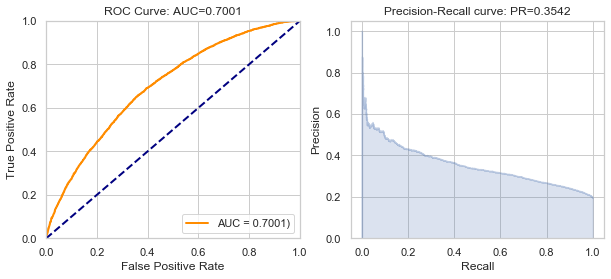

In [102]:
ROC_PR(AML_actual_predict)

### Observations:

I see that in the AML model, the result is very satisfactory.

In our dataset, the minority class represents 19.3% or around 1/5th of the total data, and the majority class represents  81.7% or 4/5th of the total data, or around 4 times the minority class. The underlying assumption for the stable results is that this dataset is not a bad distribution of class, and 20% data in a one class is fine for building a stable model. If we had more than 5-6 times of the minority class data in the majority class, then that would be be settled by balancing the classes.

Also, for the train test split, I found that a split of 50:50 works best for all my models. I tried other combination, but a 50% train gives me the best Lift score of 2.18 in both the models. So, I will continue with the same split ratio further.

The Best model given was a Stacked Ensemble Model, with  the following output:
- Mean Residual Deviance: 0.144316
- RMSE: 0.379889	
- MSE: 0.144316

The Auto ML Model parameters used are:
- max_runtime_secs = 1800, # 30 minutes
- max_models = 200, # test over 200 different models
- nfolds = 5,   # 5 fold cross validation for each model
- stopping_rounds = 0,
- stopping_tolerance = 0.005,
- balance_classes = False,  # True only for classification problem
- seed = 1234


#### AML regression does not accept True as a value for 'balance_classes'. 

Please see below for the meaningful business insights:

### Business Insight:

H2O package is a very effective and efficient package to build a machine learning model for predicting loan default. Also, H2O package is very handy to display the variable importance, handle correlations, and also dummy code the categorical variables. 

Gains table and Lift:
For the final model I built after tuning all the models on various different values of each parameter and finally tuning all the hyper-parameters for the best result, the highest `Lift` score I obtained is 2.18, which is good as per industry standards. A Lift score of around 2 is suitable for the model to be of acceptable standards.

ROC and AUC:
The area under the ROC curve (AUC) assesses overall classification performance. But, AUC does not place more emphasis on one class over the other, so it does not reflect the minority class well. The Precision-Recall (PR) curves will be more informative than ROC when dealing with highly skewed datasets. The PR curves plot precision vs. recall (FPR). Because Precision is directly influenced by class imbalance so the Precision-recall curves are better to highlight differences between models for highly imbalanced data sets. 

However, both of them do not accurately represent the results, as one doesnt reflect the minority class well, and the other is sensitive to imbalanced data. Hence, we use the H2O package, which takes care of all these problems for us. We get an AUC of 0.7 and PR of 0.35, which is acceptable, but I will try to improve them further.

#### The major outcome of this excercise is that AML is a good model to predict loan default, as per the given data. This model makes use of a smart but mazy algorithm, which computes many different types of machine learning models, and selects the best of all models. The most important variables are:
- MB007
-  AP004

The best lift is 2.18

### Conclusion:

As per my model building analysis, I saw that h2o Random Forest (through Over Sampling) gave me the best `Lift Score of 3.01`, as was seen in the previous week's submission.

For this week, out of GLM and AML, after fine tuning all parameters, I find that AML gives a slightly better result, and the highest `Lift Score is 2.18`, from the AML model. 

Now, AML is a smart algorithm, which makes many different models, such as RF, GBM, GLM, etc. However, I also suggest using either Random Forest or GBM separately, to fine tune the parameters, for predicting Loan Defaults. However, other models such as xgboost, and others might also be explored. 